In [3]:
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [8]:
elnino = read.table("./data/elnino")
colnames(elnino) = c("buoy_no","day_no", "latitude","longitude","zonal_winds", "meridional_winds", "relative_humidity", "air_temperature", "sea_surface_temperature")
elnino

buoy_no,day_no,latitude,longitude,zonal_winds,meridional_winds,relative_humidity,air_temperature,sea_surface_temperature
<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,8.96,-140.32,-6.3,-6.4,83.5,27.32,27.57
1,2,8.95,-140.32,-5.7,-3.6,86.4,26.70,27.62
1,3,8.96,-140.32,-6.2,-5.8,83.0,27.36,27.68
1,4,8.96,-140.34,-6.4,-5.3,82.2,27.32,27.70
1,5,8.96,-140.33,-4.9,-6.2,87.3,27.09,27.85
1,6,8.96,-140.33,-6.3,-4.9,91.5,26.82,27.98
1,7,8.97,-140.32,-6.7,-3.7,94.1,26.62,28.04
1,8,8.96,-140.33,-6.3,-4.8,92.0,26.89,27.98
1,9,8.97,-140.33,-6.3,-4.9,86.9,27.44,28.13


In [9]:
summary(elnino)

    buoy_no          day_no          latitude         longitude      
 Min.   : 1.00   Min.   : 1.000   Min.   :-8.2800   Min.   :-179.97  
 1st Qu.:15.00   1st Qu.: 4.000   1st Qu.:-4.9800   1st Qu.:-154.99  
 Median :31.00   Median : 7.000   Median : 0.0000   Median :-124.89  
 Mean   :30.32   Mean   : 7.226   Mean   : 0.2827   Mean   : -66.36  
 3rd Qu.:45.00   3rd Qu.:11.000   3rd Qu.: 4.9700   3rd Qu.: -94.95  
 Max.   :59.00   Max.   :14.000   Max.   : 8.9700   Max.   : 179.80  
 zonal_winds        meridional_winds   relative_humidity  air_temperature   
 Length:782         Length:782         Length:782         Length:782        
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
                                                                            
                                                                            
                                                

In [10]:
elnino[elnino == "."] = NA
elnino[elnino == ". "] = NA

In [11]:
colSums(is.na(elnino))

buoy_no                  day_no                latitude 
                      0                       0                       0 
              longitude             zonal_winds        meridional_winds 
                      0                     105                     105 
      relative_humidity         air_temperature sea_surface_temperature 
                    158                      98                      73

In [12]:
sapply(elnino, class)

buoy_no                  day_no                latitude 
              "integer"               "integer"               "numeric" 
              longitude             zonal_winds        meridional_winds 
              "numeric"             "character"             "character" 
      relative_humidity         air_temperature sea_surface_temperature 
            "character"             "character"             "character"

In [13]:
elnino$zonal_winds = as.double(elnino$zonal_winds)
elnino$meridional_winds = as.double(elnino$meridional_winds)
elnino$relative_humidity = as.double(elnino$relative_humidity)
elnino$air_temperature = as.double(elnino$air_temperature)
elnino$sea_surface_temperature = as.double(elnino$sea_surface_temperature)
head(elnino)

,buoy_no,day_no,latitude,longitude,zonal_winds,meridional_winds,relative_humidity,air_temperature,sea_surface_temperature
,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,1,8.96,-140.32,-6.3,-6.4,83.5,27.32,27.57
2,1,2,8.95,-140.32,-5.7,-3.6,86.4,26.70,27.62
3,1,3,8.96,-140.32,-6.2,-5.8,83.0,27.36,27.68
4,1,4,8.96,-140.34,-6.4,-5.3,82.2,27.32,27.70
5,1,5,8.96,-140.33,-4.9,-6.2,87.3,27.09,27.85
6,1,6,8.96,-140.33,-6.3,-4.9,91.5,26.82,27.98


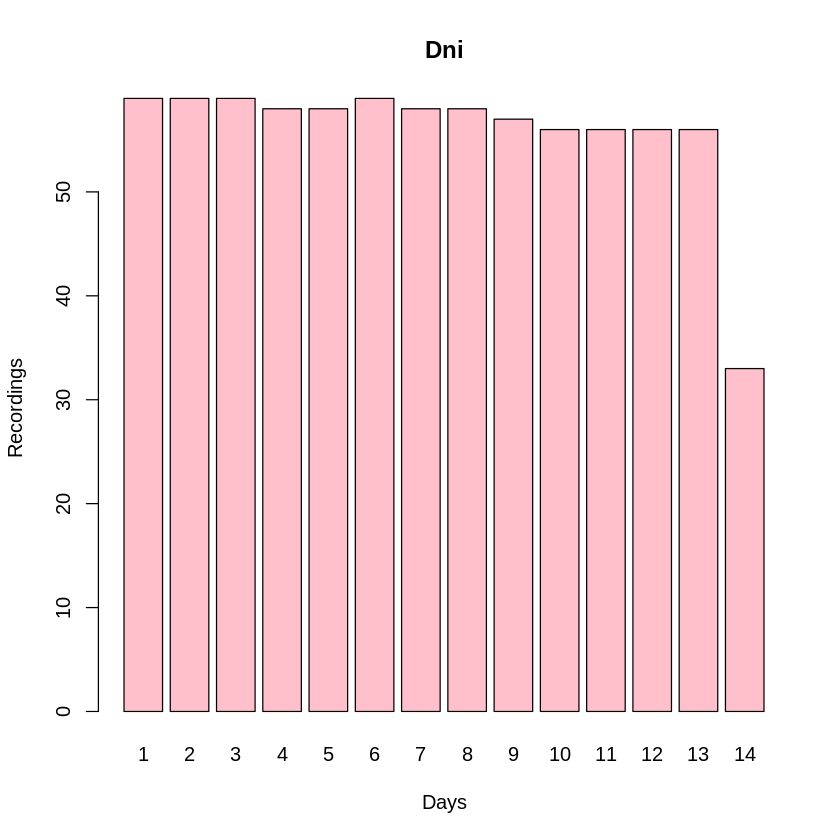

In [11]:
barplot(table(elnino$day_no), col = "pink", main="Dni", xlab="Days", ylab="Recordings")

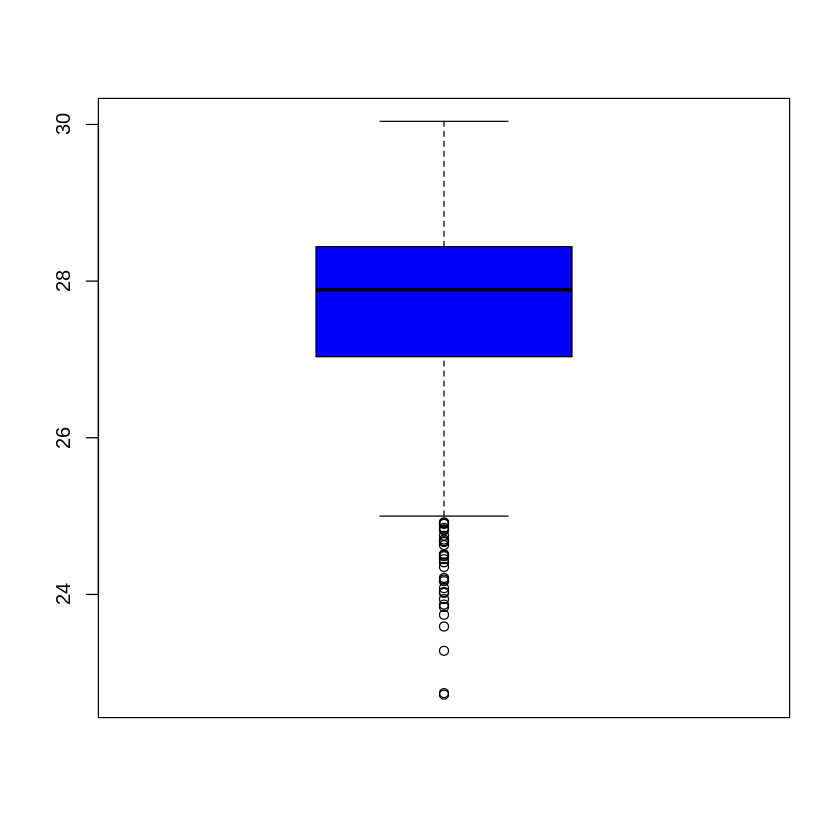

In [16]:
boxplot(elnino$air_temperature, col = "blue")

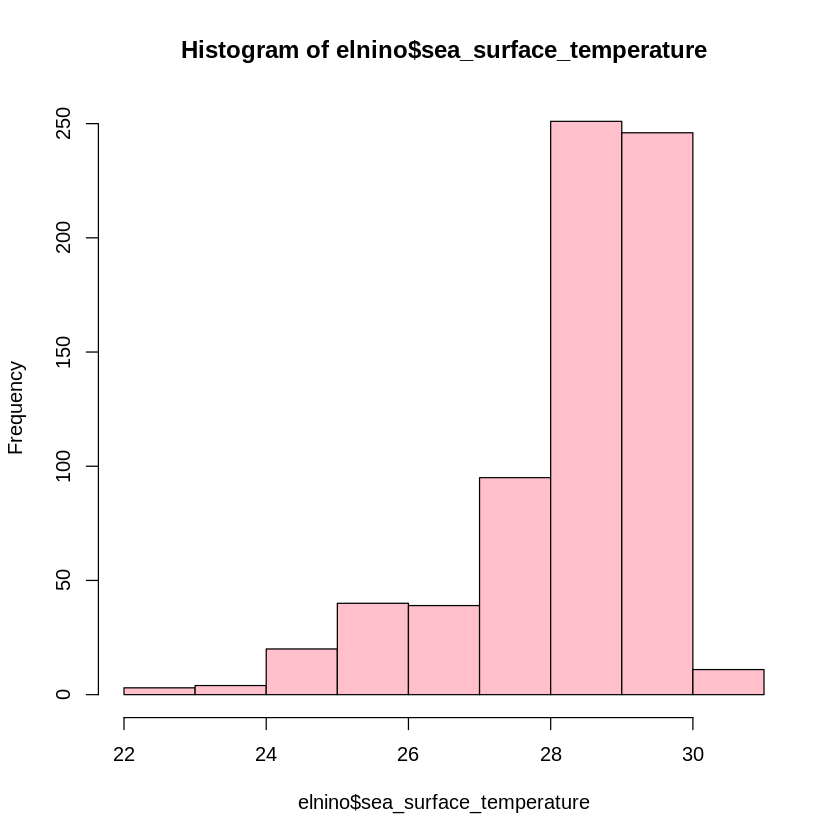

In [19]:
hist(elnino$sea_surface_temperature, col = "pink")

In [14]:
elnino_2 = elnino
elnino_2$zonal_winds[is.na(elnino_2$zonal_winds)] = mean(elnino_2$zonal_winds, na.rm = TRUE)

In [21]:
elnino_2$meridional_winds[is.na(elnino_2$meridional_winds)] = mean(elnino_2$meridional_winds, na.rm = TRUE)
elnino_2$relative_humidity[is.na(elnino_2$relative_humidity)] = median(elnino_2$relative_humidity, na.rm = TRUE)
elnino_2$air_temperature[is.na(elnino_2$air_temperature)] = median(elnino_2$air_temperature, na.rm = TRUE)

In [22]:
elnino_2 <- subset(elnino_2, select= -sea_surface_temperature)

In [23]:
summary(elnino_2)

    buoy_no          day_no          latitude         longitude      
 Min.   : 1.00   Min.   : 1.000   Min.   :-8.2800   Min.   :-179.97  
 1st Qu.:15.00   1st Qu.: 4.000   1st Qu.:-4.9800   1st Qu.:-154.99  
 Median :31.00   Median : 7.000   Median : 0.0000   Median :-124.89  
 Mean   :30.32   Mean   : 7.226   Mean   : 0.2827   Mean   : -66.36  
 3rd Qu.:45.00   3rd Qu.:11.000   3rd Qu.: 4.9700   3rd Qu.: -94.95  
 Max.   :59.00   Max.   :14.000   Max.   : 8.9700   Max.   : 179.80  
  zonal_winds     meridional_winds  relative_humidity air_temperature
 Min.   :-8.900   Min.   :-6.4000   Min.   :27.58     Min.   :22.72  
 1st Qu.:-5.200   1st Qu.:-2.2000   1st Qu.:82.10     1st Qu.:27.26  
 Median :-3.902   Median :-0.6019   Median :84.10     Median :27.89  
 Mean   :-3.902   Mean   :-0.6019   Mean   :84.39     Mean   :27.61  
 3rd Qu.:-3.100   3rd Qu.: 0.7000   3rd Qu.:86.78     3rd Qu.:28.36  
 Max.   : 7.000   Max.   : 7.1000   Max.   :99.40     Max.   :30.04  

In [24]:
colSums(is.na(elnino_2))

buoy_no            day_no          latitude         longitude 
                0                 0                 0                 0 
      zonal_winds  meridional_winds relative_humidity   air_temperature 
                0                 0                 0                 0

In [15]:
elnino_1 = elnino
elnino_1 = na.omit(elnino_1)


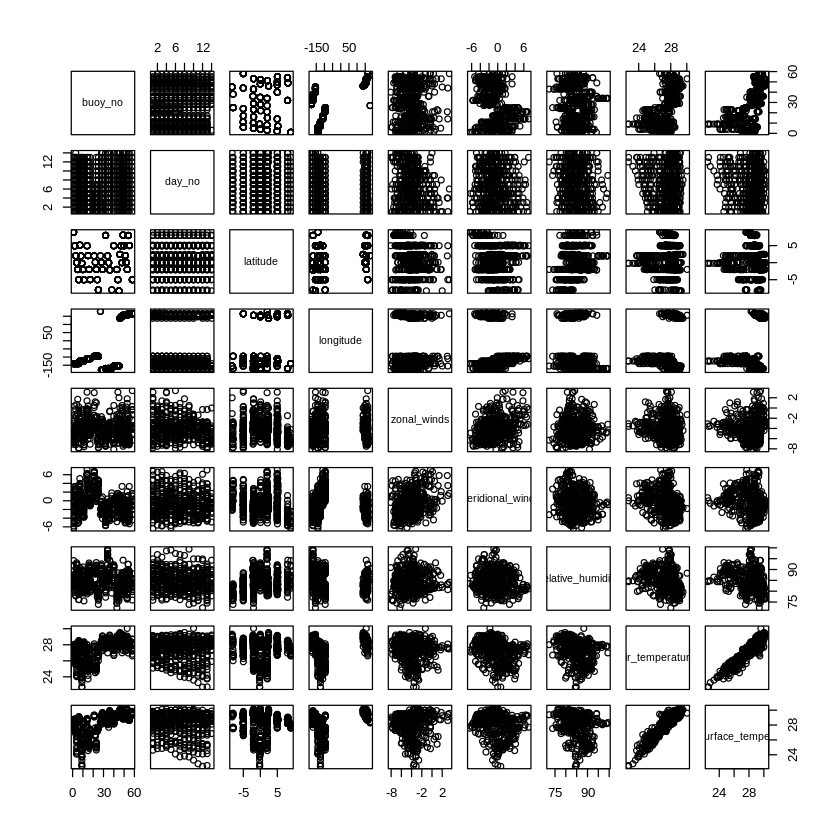

In [26]:
plot(elnino_1)

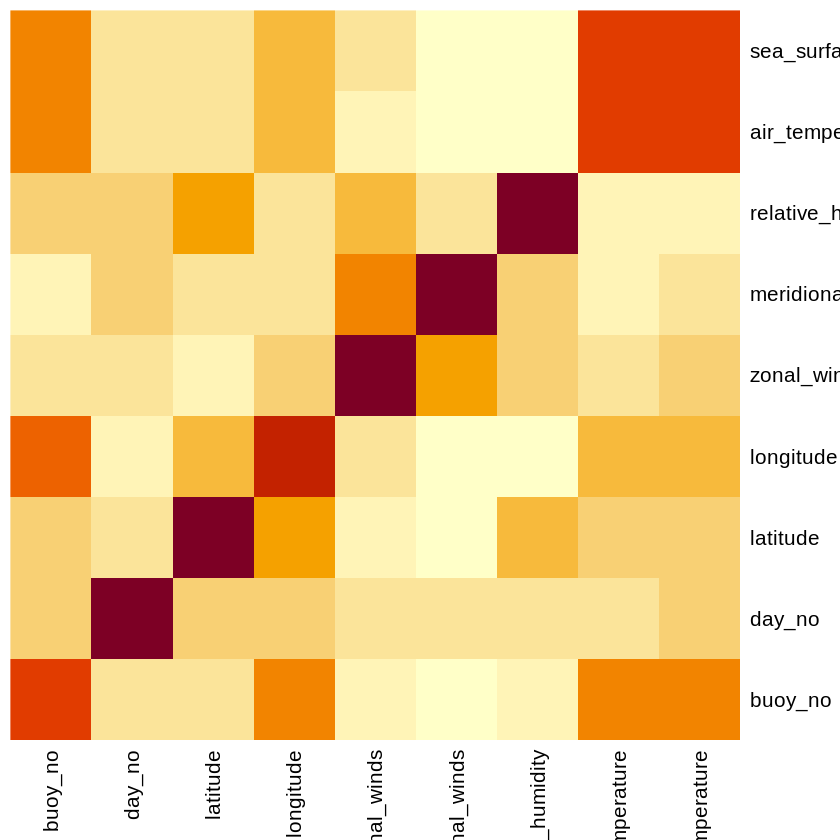

In [35]:
heatmap(cor(elnino_1), Rowv = NA, Colv = NA)

In [16]:
elnino_1$zon_winds_1 = ifelse(elnino_1$zonal_winds > 0,  "East", "West")
elnino_1$mer_winds_1 = ifelse(elnino_1$meridional_winds > 0, "North", "South")

In [17]:
elnino_1 = elnino_1[c('buoy_no', 'day_no', 'latitude', 'longitude', 'zonal_winds','zon_winds_1',
       'meridional_winds','mer_winds_1', 'relative_humidity', 'air_temperature',
       'sea_surface_temperature')]

In [18]:
elnino_1$zon_winds_1 = as.factor(elnino_1$zon_winds_1)
elnino_1$mer_winds_1 = as.factor(elnino_1$mer_winds_1)

In [19]:
elnino_1$relative_humidity <- (elnino_1$relative_humidity - mean(elnino_1$relative_humidity)) / sd(elnino_1$relative_humidity)
elnino_1$air_temperature = (elnino_1$air_temperature - min(elnino_1$air_temperature)) / (max(elnino_1$air_temperature) - min(elnino_1$air_temperature)) * 2 - 1

In [20]:
elnino_1$s_s_temp_1 <- cut(elnino_1$sea_surface_temperature, breaks=4, include.lowest=TRUE)
summary(elnino_1$s_s_temp_1)

[22.4,24.4] (24.4,26.4] (26.4,28.4] (28.4,30.3] 
         12          61         142         318

In [21]:
elnino_1$s_s_temp_2 <- cut(elnino_1$sea_surface_temperature, breaks=c(20, 24, 28, 32), labels=c("1", "2", "3"), include.lowest=TRUE)

table(elnino_1$s_s_temp_2)


  1   2   3 
  7 152 374 

In [25]:
install.packages('timereg')

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [26]:
library("timereg")

Loading required package: survival



In [31]:
unique(EqualFreq(elnino_1$sea_surface_temperature, 5))

[1] (27.2,28.4] (28.4,28.9] [22.4,27.2] (28.9,29.4] (29.4,30.3]
Levels: [22.4,27.2] (27.2,28.4] (28.4,28.9] (28.9,29.4] (29.4,30.3]

In [5]:
EqualFreq <-function(x, n){
    nx <- length(x)    
    id <- round(c(1,(1:(n-1))*(nx/n),nx))

    breaks <- sort(x)[id]
    
    cut(x, breaks, include.lowest=TRUE)
}
       
elnino_1$s_s_temp_3 <- EqualFreq(elnino_1$sea_surface_temperature, 5)

table(elnino_1$s_s_temp_3)

ERROR: Error in cut.default(x, breaks, include.lowest = TRUE): 'x' must be numeric


In [46]:
sample_data = elnino_1[sample(nrow(elnino_1), 100), ]
sample_data

,buoy_no,day_no,latitude,longitude,zonal_winds,zon_winds_1,meridional_winds,mer_winds_1,relative_humidity,air_temperature,sea_surface_temperature,s_s_temp_1,s_s_temp_2,s_s_temp_3
,<int>,<int>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>
99,8,5,1.96,-125.07,-4.9,West,2.2,North,-0.14110068,-0.29781421,25.82,"(24.4,26.4]",2,"[22.4,27.2]"
143,11,10,-5.02,-124.94,-4.5,West,-3.7,South,-0.90076392,0.43442623,28.17,"(26.4,28.4]",3,"(27.2,28.4]"
360,29,5,-1.98,-179.85,-2.6,West,-2.2,South,0.32810309,0.53825137,29.58,"(28.4,30.3]",3,"(29.4,30.3]"
177,14,5,4.98,-109.96,-0.1,West,4.9,North,-0.81139177,0.30874317,28.67,"(28.4,30.3]",3,"(28.4,28.9]"
727,55,10,5.03,165.02,-7.2,West,-3.1,South,0.12701576,0.56010929,28.82,"(28.4,30.3]",3,"(28.4,28.9]"
133,10,13,-2.03,-124.89,-2.7,West,-3.2,South,0.61856256,-0.40437158,25.42,"(24.4,26.4]",2,"[22.4,27.2]"
614,47,8,4.97,147.00,-4.8,West,-1.9,South,-0.94544999,0.61748634,29.23,"(28.4,30.3]",3,"(28.9,29.4]"
640,49,7,8.08,156.02,-5.2,West,-3.4,South,-0.47624622,0.46721311,28.81,"(28.4,30.3]",3,"(28.4,28.9]"
684,52,9,0.06,156.16,0.2,East,-0.8,South,0.08232969,0.38251366,29.55,"(28.4,30.3]",3,"(29.4,30.3]"
